<h1 style="font-size:30px;">Finetuning YOLOV8 for Instance Segmentation on Custom Dataset</h1>

In this notebook, we will finetune the  YOLOv8l-seg model on NulnSeg Kaggle dataset.

<img src = "https://learnopencv.com/wp-content/uploads/2024/04/Notebook-Feature-Image-YOLOv9-for-Instance-Segmentation.png" width=1000 height=500>



NulnsSeg Kaggle dataset contains more than 30k manually segmented nuclei from 31 human and mouse organs and 665 image patches extracted from H&E-stained whole slide microscopic images. 

The dataset contains tissues of various human and mouse organs.
Key human and mouse organs include the cerebellum, kidney, liver, pancreas, etc.

The dataset contains a single Nuclei class.

The dataset has `665` images in total so we will split it with an 80:20 train val split ratio.
So, the final split has `532` training and `133` validation images, respectively.


Dependencies

In [1]:
!pip install -q ultralytics pycocotools scikit-learn matplotlib 

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 749.5/749.5 kB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 38.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 44.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 62.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 1.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 11.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.0/166.0 MB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.1/99.1 kB 13.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━

Imports

In [1]:
import os
import copy
import random
import json
import yaml
import glob
import cv2
import numpy as np
import time
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import requests
from   zipfile import ZipFile
import argparse
from PIL import Image
import PIL.Image
import shutil
from IPython.display import Image
from sklearn.model_selection import train_test_split

import torch
import torch.utils.data
from torch import nn
import torchvision
from ultralytics import YOLO

from torchvision import transforms as T


from pycocotools import mask as coco_mask
from pycocotools.coco import COCO


This function block is used to **download and unzip** the dataset in the specified directory.

In [2]:
def download_and_unzip(url, save_path, extract_dir):
    print("Downloading assets...")
    file = requests.get(url)
    open(save_path, "wb").write(file.content)
    print("Download completed.")

    try:
        if save_path.endswith(".zip"):
            with ZipFile(save_path, 'r') as zip_ref:
                zip_ref.extractall(extract_dir)
            print("Extraction Done")
    except Exception as e:
        print(f"An error occurred: {e}")

DATASET_URL = r"https://www.dropbox.com/scl/fi/u83yuoea9hu7xhhhsgp4d/Nuclei_Instance_Seg.zip?rlkey=7tw3vs4xh7rych4yq1xizd8mh&dl=1"
DATASET_DIR = "Nuclei-Instance-Dataset"
DATASET_ZIP_PATH = os.path.join(os.getcwd(), f"{DATASET_DIR}.zip")

# Download and extract if dataset does not exist.
if not os.path.exists(DATASET_DIR):
    os.makedirs(DATASET_DIR, exist_ok=True)  # Ensure the directory exists
    download_and_unzip(DATASET_URL, DATASET_ZIP_PATH, DATASET_DIR)
    os.remove(DATASET_ZIP_PATH)  # Remove the zip file after extraction


Download completed.
Extraction Done


## Data Preparation

The dataset comes with many subdirectories. However, for our `YOLOv8l-seg` fine-tuning, we just need the raw images and labeled masks, which we will convert to the appropriate format. 

For our task, we will keep the directories with subdirectories named `‘tissue images’` , `‘mask binary without border’`, and `‘label masks modify’`.


In [3]:
def prune_subdirectories(base_dir,keep_dirs):
    #Iterate through each subdirs in base dir
    for root_dir in os.listdir(base_dir):
        root_path = os.path.join(base_dir,root_dir)
        if os.path.isdir(root_path):
          #  print(f"Processing: {root_path}")
           #List all subdirs inside the current root dir
           for sub_dir in os.listdir(root_path):
               sub_path = os.path.join(root_path, sub_dir)
               #If the subdirectory isn't in the keep list, delete it
               if os.path.isdir(sub_path) and sub_dir not in keep_dirs:
                  # print(f"Deleting: {sub_path}")
                  shutil.rmtree(sub_path)
               elif os.path.isdir(sub_path):
                  # print(f"Keeping: {sub_path}")
                  pass


base_directory = "./Nuclei-Instance-Dataset"
directories_to_keep = ['tissue images', 'mask binary witthout border', 'label masks modify']

prune_subdirectories(base_directory,directories_to_keep)



In [4]:
!sudo apt install tree

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tree is already the newest version (2.0.2-1).
0 upgraded, 0 newly installed, 0 to remove and 13 not upgraded.


After pruning, our dataset tree will look like this:

In [5]:
!tree --dirsfirst -L 2  "Nuclei-Instance-Dataset"

Nuclei-Instance-Dataset
├── human bladder
│   ├── label masks modify
│   └── tissue images
├── human brain
│   ├── label masks modify
│   └── tissue images
├── human cardia
│   ├── label masks modify
│   └── tissue images
├── human cerebellum
│   ├── label masks modify
│   └── tissue images
├── human epiglottis
│   ├── label masks modify
│   └── tissue images
├── human jejunum
│   ├── label masks modify
│   └── tissue images
├── human kidney
│   ├── label masks modify
│   └── tissue images
├── human liver
│   ├── label masks modify
│   └── tissue images
├── human lung
│   ├── label masks modify
│   └── tissue images
├── human melanoma
│   ├── label masks modify
│   └── tissue images
├── human muscle
│   ├── label masks modify
│   └── tissue images
├── human oesophagus
│   ├── label masks modify
│   └── tissue images
├── human pancreas
│   ├── label masks modify
│   ├── tissue images
│   └── Thumbs.db
├── human peritoneum
│   ├── label masks modify
│   └── tissue images
├── human placen

## Convert Label Masks to Yolo Annotations

Next, let’s try to convert our annotations from binary masks to YOLO format. As an intermediate step, let’s convert them to COCO JSON format, which is easy to interpret.

The `get_image_mask_pairs( )` returns all image and mask paths from the dataset appended to a list.


Binary masks are a common way to represent object annotations in segmentation tasks. They efficiently encode the shape of objects at the pixel level. However, for tasks like visualization or calculating object properties, we need to convert these masks into polygons.
`mask_to_polygons( )` shows one such approach to extract polygons from a binary mask.

In [6]:
def get_image_mask_pairs(data_dir):
    image_paths = []
    mask_paths = []

    for root,_,files in os.walk(data_dir):
        if 'tissue images' in root:
            for file in files:
                if file.endswith('.png'):
                    image_paths.append(os.path.join(root,file))
                    mask_paths.append(os.path.join(root.replace('tissue images','label masks modify'), file.replace('.png','.tif')))
    return image_paths, mask_paths


We need to convert our tissue’s binary mask to actionable polygon points. For this, let’s use `cv2.findContours` to extract approximate polygons of the binary mask. This ensures we get a valid closed polygon with more than 4 sides and outlines around mask borders.
By using `cv2.RETR_TREE` as contour retrieval mode, we can reconstruct a hierarchical relationship between all the detected contours.

In [7]:
def mask_to_polygons(mask,epsilon=1.0):
    contours,_ = cv2.findContours(mask,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
    polygons = []
    for contour in contours:
        if len(contour) > 2:
           poly = contour.reshape(-1).tolist()
           if len(poly) > 4: #Ensures valid polygon
              polygons.append(poly)
    return polygons

## Dataset Preparation

In `process_data( )`, we will initialize annotation and images as empty lists to which we will append all the metadata. Additionally, image ID and ann ID will have zero as initial values.

We will simultaneously iterate through the image_paths and mask_path list we got from the  `get_image_mask_pairs` utility function. For each image, we assign a unique `image_id` by incrementing with 1 after each iteration. Then, we will read our image and mask using opencv. The `cv2.IMREAD_UNCHANGED` helps to read masks, including an alpha channel if present.

For each value representing an object(ignoring background), we construct a binary mask where pixels corresponding to the current unique value are set to 255(white) to highlight the object instance. 

While all other pixels are set to 0(black) effectively isolating the object from the background. The binary mask is then passed as input to the `mask_to_polygons( )` function, which processes the mask and returns a series of polygons.


In [8]:
def process_data(image_paths, mask_paths, output_images_dir, output_labels_dir):
    annotations = []
    images = []
    image_id = 0
    ann_id = 0

    for img_path, mask_path in zip(image_paths, mask_paths):
        image_id += 1
        img = cv2.imread(img_path)
        mask = cv2.imread(mask_path, cv2.IMREAD_UNCHANGED)
        shutil.copy(img_path, os.path.join(output_images_dir, os.path.basename(img_path)))

        # Add image to the list
        images.append({
            "id": image_id,
            "file_name": os.path.basename(img_path),
            "height": img.shape[0],
            "width": img.shape[1]
        })

        unique_values = np.unique(mask)
        for value in unique_values:
            if value == 0:  # Ignore background
                continue

            object_mask = (mask == value).astype(np.uint8) * 255
            polygons = mask_to_polygons(object_mask)

            for poly in polygons:
                ann_id += 1
                annotations.append({
                
                    "image_id": image_id,
                    "category_id": 1,  # Only one category: Nuclei
                    "segmentation": [poly],
                   
                })

    coco_input = {
        "images": images,
        "annotations": annotations,
        "categories": [{"id": 1, "name": "Nuclei"}]
    }

    # Convert COCO-like dictionary to YOLO format
    for img_info in coco_input["images"]:
        img_id = img_info["id"]
        img_ann = [ann for ann in coco_input["annotations"] if ann["image_id"] == img_id]
        img_w, img_h = img_info["width"], img_info["height"]

        if img_ann:
            with open(os.path.join(output_labels_dir, os.path.splitext(img_info["file_name"])[0] + '.txt'), 'w') as file_object:
                for ann in img_ann:
                    current_category = ann['category_id'] - 1
                    polygon = ann['segmentation'][0]
                    normalized_polygon = [format(coord / img_w if i % 2 == 0 else coord / img_h, '.6f') for i, coord in enumerate(polygon)]
                    file_object.write(f"{current_category} " + " ".join(normalized_polygon) + "\n")



Now, for each image, a corresponding .txt annotation file is created, and we extract the ‘category_id’ and ‘polygon’ of the current object instance in a recurring loop. The polygon is then normalized relative to the current image dimensions. Thus, a set of .txt files for all images is created in the output labels dir, which will be utilized during fine-tuning.

In [9]:
def create_yaml(output_yaml_path, train_images_dir, val_images_dir, nc=1):
    # Assuming all categories are the same and there is only one class, 'Nuclei'
    names = ['Nuclei']

    # Create a dictionary with the required content
    yaml_data = {
        'names': names,
        'nc': nc,  # Number of classes
        'train': train_images_dir,
        'val': val_images_dir,
        'test': ' '

    }

    # Write the dictionary to a YAML file
    with open(output_yaml_path, 'w') as file:
        yaml.dump(yaml_data, file, default_flow_style=False)


Now, the `yolo_dataset_preparation( )` function defines all the paths and calls the required set of utility functions. To simply put, this function is responsible for extracting the polygons from the raw binary masks and converting them into YOLO format. Finally, it creates `data.yaml` file for our finetuning.

In [10]:
def yolo_dataset_preparation():
    data_dir = 'Nuclei-Instance-Dataset'
    output_dir = 'yolov8_l_dataset'

    # Define the paths for the images and labels for training and validation
    train_images_dir = os.path.join(output_dir, 'train', 'images')
    val_images_dir = os.path.join(output_dir, 'val', 'images')
    train_labels_dir = os.path.join(output_dir, 'train', 'labels')
    val_labels_dir = os.path.join(output_dir, 'val', 'labels')

    # Create the output directories if they do not exist
    os.makedirs(train_images_dir, exist_ok=True)
    os.makedirs(val_images_dir, exist_ok=True)
    os.makedirs(train_labels_dir, exist_ok=True)
    os.makedirs(val_labels_dir, exist_ok=True)

    # Get image and mask paths
    image_paths, mask_paths = get_image_mask_pairs(data_dir)

    # Split data into train and val
    train_img_paths, val_img_paths, train_mask_paths, val_mask_paths = train_test_split(image_paths, mask_paths, test_size=0.2, random_state=42)

    # Process and save the data in YOLO format for training and validation
    process_data(train_img_paths, train_mask_paths, train_images_dir, train_labels_dir)
    process_data(val_img_paths, val_mask_paths, val_images_dir, val_labels_dir)

    # Assume create_yaml function is defined elsewhere and set appropriate paths for the YAML file
    output_yaml_path = os.path.join(output_dir, 'data.yaml')
    train_path = os.path.join('train', 'images')
    val_path = os.path.join('val', 'images')
    create_yaml(output_yaml_path, train_path, val_path)

yolo_dataset_preparation()

## Model Configuration

In [12]:
#Instance
model = YOLO("yolov8l-seg.yaml")#build a model from YAML
model = YOLO("yolov8l-seg.pt") #Transfer the weights from a pretrained model (recommended for training)

100%|██████████| 88.1M/88.1M [00:00<00:00, 180MB/s]


**Restart session if dill package gets updated**

In [13]:
%cat yolov8_l_dataset/data.yaml

names:
- Nuclei
nc: 1
test: ' '
train: train/images
val: val/images


In [14]:
with open("yolov8_l_dataset/data.yaml",'r') as stream:
     num_classes = str(yaml.safe_load(stream)['nc'])

## Train the Model

In [15]:
#Define a project --> Destination directory for all results
project = "yolov8_l_dataset/results"
#Define subdirectory for this specific training
name = "70_epochs-"


In [16]:
ABS_PATH = os.getcwd()

In [17]:
#Train the model
results = model.train(
    data = os.path.join(ABS_PATH, "yolov8_l_dataset/data.yaml"),
    project = project,
    name = name,
    epochs = 70,
    patience = 0 , #setting patience=0 to disable early stopping,
    batch = 3,
    imgsz=1024
)

Ultralytics YOLOv8.1.45 🚀 Python-3.10.14 torch-2.2.2 CUDA:0 (NVIDIA GeForce RTX 4090, 24217MiB)
engine/trainer: task=segment, mode=train, model=yolov8l-seg.pt, data=/1024_v8l_workspace/yolov8_l_dataset/data.yaml, epochs=70, time=None, patience=0, batch=3, imgsz=1024, save=True, save_period=-1, cache=False, device=None, workers=8, project=yolov8_l_dataset/results, name=70_epochs-, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False,

100%|██████████| 6.23M/6.23M [00:00<00:00, 90.6MB/s]


AMP: checks passed ✅


train: Scanning /1024_v8l_workspace/yolov8_l_dataset/train/labels... 532 images, 0 backgrounds, 0 corrupt: 100%|██████████| 532/532 [00:02<00:00, 185.11it/s]


train: New cache created: /1024_v8l_workspace/yolov8_l_dataset/train/labels.cache


val: Scanning /1024_v8l_workspace/yolov8_l_dataset/val/labels... 133 images, 0 backgrounds, 0 corrupt: 100%|██████████| 133/133 [00:00<00:00, 161.26it/s]


val: New cache created: /1024_v8l_workspace/yolov8_l_dataset/val/labels.cache
Plotting labels to yolov8_l_dataset/results/70_epochs-/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 106 weight(decay=0.0), 117 weight(decay=0.0004921875), 116 bias(decay=0.0)
Image sizes 1024 train, 1024 val
Using 8 dataloader workers
Logging results to yolov8_l_dataset/results/70_epochs-
Starting training for 70 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/70      18.8G      1.735      2.728       1.58      1.472        139       1024: 100%|██████████| 178/178 [00:26<00:00,  6.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:09<00:00,  2.49it/s]

                   all        133       6958      0.671      0.628      0.676      0.349      0.659      0.609      0.649        0.3



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/70      21.3G       1.74      2.712      1.325      1.471         77       1024: 100%|██████████| 178/178 [00:23<00:00,  7.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.24it/s]

                   all        133       6958      0.722      0.621      0.697      0.365      0.724      0.593      0.667      0.316



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/70      15.1G      1.717      2.656      1.323      1.458          9       1024: 100%|██████████| 178/178 [00:24<00:00,  7.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.39it/s]

                   all        133       6958      0.712      0.653      0.716      0.365      0.698      0.636      0.694      0.313



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/70      23.2G      1.679       2.61      1.251      1.462        158       1024: 100%|██████████| 178/178 [00:24<00:00,  7.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.27it/s]

                   all        133       6958      0.799      0.701      0.791      0.424      0.795      0.687      0.774      0.387



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/70      14.3G      1.662      2.561      1.222       1.44         48       1024: 100%|██████████| 178/178 [00:23<00:00,  7.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.34it/s]

                   all        133       6958      0.781      0.683      0.767      0.403      0.774      0.669      0.744      0.355



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/70      12.7G      1.686      2.571      1.168      1.451         43       1024: 100%|██████████| 178/178 [00:23<00:00,  7.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.41it/s]


                   all        133       6958      0.784      0.652      0.754      0.403      0.777      0.637      0.731      0.361

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/70      13.8G      1.704      2.569      1.201       1.46         25       1024: 100%|██████████| 178/178 [00:23<00:00,  7.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.28it/s]

                   all        133       6958      0.739      0.688      0.746       0.38      0.739      0.679      0.736      0.344



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/70      13.5G      1.673      2.584      1.158      1.416         17       1024: 100%|██████████| 178/178 [00:23<00:00,  7.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.41it/s]

                   all        133       6958      0.776      0.663      0.744      0.408      0.764      0.647      0.722      0.361



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/70      16.7G      1.632      2.505      1.141      1.421         45       1024: 100%|██████████| 178/178 [00:23<00:00,  7.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.33it/s]


                   all        133       6958      0.786      0.693      0.786      0.441       0.78       0.69      0.772        0.4

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/70        19G      1.655      2.475      1.107      1.425         47       1024: 100%|██████████| 178/178 [00:23<00:00,  7.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.25it/s]

                   all        133       6958      0.776      0.703      0.781      0.425      0.766      0.692      0.765      0.385



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/70      24.3G      1.665      2.492      1.139      1.445        139       1024: 100%|██████████| 178/178 [00:23<00:00,  7.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.43it/s]

                   all        133       6958      0.758      0.649       0.73      0.402      0.749      0.642      0.713      0.364



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/70      24.6G      1.598      2.405      1.084      1.387         58       1024: 100%|██████████| 178/178 [00:23<00:00,  7.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.37it/s]


                   all        133       6958      0.778      0.704      0.792      0.446      0.771      0.698      0.778      0.406

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/70        18G      1.587       2.38      1.041      1.398         49       1024: 100%|██████████| 178/178 [00:24<00:00,  7.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.22it/s]

                   all        133       6958      0.783      0.706      0.786      0.438      0.781      0.695      0.773      0.397



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/70      13.5G      1.586      2.385      1.067      1.399        101       1024: 100%|██████████| 178/178 [00:23<00:00,  7.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.35it/s]

                   all        133       6958      0.796      0.739      0.813      0.459      0.789      0.732      0.802      0.422



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/70      22.9G       1.57      2.361       1.03       1.38         41       1024: 100%|██████████| 178/178 [00:23<00:00,  7.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.37it/s]


                   all        133       6958      0.804      0.703      0.793      0.451      0.802      0.694      0.781       0.41

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/70      13.8G      1.562      2.335       1.01      1.362         86       1024: 100%|██████████| 178/178 [00:23<00:00,  7.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.43it/s]

                   all        133       6958      0.812      0.723      0.811      0.457      0.803      0.717      0.799      0.412



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/70      17.2G      1.557      2.363      1.002       1.37         39       1024: 100%|██████████| 178/178 [00:23<00:00,  7.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.31it/s]

                   all        133       6958      0.802      0.691      0.786       0.45        0.8      0.677       0.77      0.404



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/70      19.7G      1.564      2.339      1.047      1.362         35       1024: 100%|██████████| 178/178 [00:23<00:00,  7.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.32it/s]

                   all        133       6958      0.782      0.655      0.752      0.423      0.771      0.642      0.732      0.379



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/70      12.4G      1.544      2.297     0.9915      1.352         25       1024: 100%|██████████| 178/178 [00:23<00:00,  7.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.51it/s]

                   all        133       6958      0.814      0.726      0.819      0.465       0.81      0.718      0.807      0.425



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/70      13.2G      1.535       2.29     0.9707      1.359         83       1024: 100%|██████████| 178/178 [00:23<00:00,  7.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.34it/s]

                   all        133       6958      0.817      0.705      0.808      0.465      0.815      0.694      0.794      0.423



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/70      20.1G      1.516      2.277     0.9589      1.331        120       1024: 100%|██████████| 178/178 [00:24<00:00,  7.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.45it/s]

                   all        133       6958      0.833      0.742      0.832      0.466      0.827      0.737      0.822      0.426



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/70      13.3G      1.544      2.305     0.9908      1.352         55       1024: 100%|██████████| 178/178 [00:23<00:00,  7.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.43it/s]

                   all        133       6958      0.809      0.705      0.803      0.466      0.808      0.694      0.791      0.424



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/70      15.4G      1.514      2.268     0.9434      1.333         26       1024: 100%|██████████| 178/178 [00:23<00:00,  7.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.45it/s]

                   all        133       6958      0.807      0.749      0.832      0.473      0.803      0.743      0.819      0.434



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/70      15.2G      1.533      2.298     0.9731       1.35         40       1024: 100%|██████████| 178/178 [00:23<00:00,  7.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.42it/s]

                   all        133       6958       0.81      0.738      0.822      0.462      0.801      0.728      0.806      0.412



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/70      13.7G      1.532        2.3     0.9426      1.349        120       1024: 100%|██████████| 178/178 [00:23<00:00,  7.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.55it/s]

                   all        133       6958      0.832      0.732      0.832      0.478      0.823      0.723      0.819      0.434



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/70      14.9G      1.521      2.269     0.9358      1.355         37       1024: 100%|██████████| 178/178 [00:23<00:00,  7.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.44it/s]

                   all        133       6958      0.823       0.72      0.817      0.472      0.821      0.718      0.812       0.43



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/70      15.3G      1.508      2.242       0.93      1.352         26       1024: 100%|██████████| 178/178 [00:23<00:00,  7.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.33it/s]

                   all        133       6958      0.821      0.762      0.836      0.478      0.816       0.75      0.825      0.437



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/70      13.1G      1.506      2.245     0.9115      1.334         28       1024: 100%|██████████| 178/178 [00:23<00:00,  7.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.33it/s]


                   all        133       6958      0.819      0.741      0.829       0.48      0.814      0.736      0.818      0.436

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/70      18.7G       1.52      2.232     0.9149      1.333         77       1024: 100%|██████████| 178/178 [00:23<00:00,  7.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.32it/s]

                   all        133       6958      0.805       0.72      0.806      0.464      0.798      0.712      0.793      0.427



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/70      15.8G      1.474      2.186     0.8806       1.32         24       1024: 100%|██████████| 178/178 [00:23<00:00,  7.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.39it/s]

                   all        133       6958      0.818       0.74      0.825      0.473      0.813      0.728      0.811      0.429



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      31/70      20.3G      1.483      2.213     0.9066      1.314         63       1024: 100%|██████████| 178/178 [00:23<00:00,  7.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.46it/s]

                   all        133       6958      0.818      0.745      0.833      0.485      0.814      0.732      0.821       0.44



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      32/70        14G      1.475      2.205     0.9088      1.325        116       1024: 100%|██████████| 178/178 [00:23<00:00,  7.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.50it/s]

                   all        133       6958      0.815      0.716      0.816      0.477      0.814      0.708      0.805      0.428



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      33/70      13.2G      1.471      2.203     0.8674      1.309         64       1024: 100%|██████████| 178/178 [00:24<00:00,  7.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.56it/s]

                   all        133       6958      0.824      0.746      0.835      0.488      0.823       0.74      0.826      0.455



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      34/70      23.7G      1.457      2.173     0.8782      1.299         22       1024: 100%|██████████| 178/178 [00:23<00:00,  7.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.46it/s]

                   all        133       6958      0.826      0.729       0.83      0.486      0.817      0.721      0.818      0.446



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      35/70      22.4G      1.447      2.153     0.8634      1.303         73       1024: 100%|██████████| 178/178 [00:23<00:00,  7.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.44it/s]

                   all        133       6958      0.821      0.765      0.843      0.492      0.813      0.758      0.832      0.453



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      36/70      15.7G      1.452      2.138     0.8423      1.296         52       1024: 100%|██████████| 178/178 [00:23<00:00,  7.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.57it/s]

                   all        133       6958      0.834      0.751      0.842      0.493      0.833      0.738      0.827      0.448



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      37/70      19.6G      1.449      2.142     0.8602      1.297         21       1024: 100%|██████████| 178/178 [00:23<00:00,  7.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.54it/s]

                   all        133       6958      0.829      0.768       0.85      0.494      0.828      0.754      0.837      0.453



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      38/70      17.4G      1.458      2.146     0.8621      1.303         66       1024: 100%|██████████| 178/178 [00:23<00:00,  7.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.38it/s]


                   all        133       6958      0.821      0.733      0.822      0.477      0.821       0.72      0.808      0.438

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      39/70      18.4G      1.476      2.153     0.8646       1.31         13       1024: 100%|██████████| 178/178 [00:23<00:00,  7.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.54it/s]

                   all        133       6958      0.818      0.752      0.833      0.483      0.814      0.741      0.821      0.443



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      40/70      22.8G      1.446      2.119     0.8337      1.292         55       1024: 100%|██████████| 178/178 [00:23<00:00,  7.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.54it/s]

                   all        133       6958      0.832      0.758      0.847      0.499      0.827      0.754      0.839       0.46



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      41/70        17G      1.436      2.115     0.8382       1.29        200       1024: 100%|██████████| 178/178 [00:23<00:00,  7.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.42it/s]

                   all        133       6958      0.818      0.761      0.845      0.494      0.815       0.75      0.833      0.448



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      42/70      12.7G      1.435      2.106     0.8449       1.29         26       1024: 100%|██████████| 178/178 [00:23<00:00,  7.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.43it/s]


                   all        133       6958      0.833      0.767      0.847      0.493      0.826      0.765      0.839      0.457

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      43/70      18.6G      1.439      2.115     0.8367      1.286        177       1024: 100%|██████████| 178/178 [00:24<00:00,  7.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.39it/s]

                   all        133       6958      0.832      0.748      0.844      0.487      0.835      0.739      0.832      0.441



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      44/70      20.3G      1.441      2.108     0.8312      1.298        111       1024: 100%|██████████| 178/178 [00:23<00:00,  7.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.56it/s]

                   all        133       6958      0.833      0.751      0.837      0.485       0.83      0.744      0.827      0.444



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      45/70      14.6G      1.429      2.084     0.8251      1.291         11       1024: 100%|██████████| 178/178 [00:23<00:00,  7.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.41it/s]

                   all        133       6958      0.833      0.767      0.846      0.493      0.827      0.756      0.834      0.447



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      46/70        19G      1.425      2.098     0.8158      1.291         16       1024: 100%|██████████| 178/178 [00:23<00:00,  7.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.45it/s]

                   all        133       6958      0.838      0.755      0.847      0.497      0.832      0.749      0.834      0.452



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      47/70      14.1G      1.411      2.084     0.8186      1.274         56       1024: 100%|██████████| 178/178 [00:23<00:00,  7.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.65it/s]

                   all        133       6958      0.846       0.75      0.844      0.498      0.845      0.741      0.835      0.459



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      48/70      19.7G       1.41      2.067     0.8084      1.267         57       1024: 100%|██████████| 178/178 [00:23<00:00,  7.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.44it/s]

                   all        133       6958      0.834      0.746      0.841      0.495      0.831      0.736       0.83      0.459



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      49/70      22.4G        1.4      2.043      0.787      1.266         33       1024: 100%|██████████| 178/178 [00:23<00:00,  7.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.35it/s]

                   all        133       6958       0.85      0.754      0.848      0.498      0.844      0.747      0.836      0.457



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      50/70      12.4G      1.407      2.051     0.7872      1.282         26       1024: 100%|██████████| 178/178 [00:23<00:00,  7.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.55it/s]

                   all        133       6958      0.847      0.764      0.851      0.499       0.84      0.753      0.837      0.457



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      51/70      21.6G      1.387      2.043     0.7736      1.269         27       1024: 100%|██████████| 178/178 [00:23<00:00,  7.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.43it/s]

                   all        133       6958      0.842      0.766      0.853      0.501      0.831      0.758      0.838      0.458



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      52/70      14.9G      1.387       2.02     0.7754      1.262         29       1024: 100%|██████████| 178/178 [00:23<00:00,  7.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.43it/s]

                   all        133       6958      0.839      0.775      0.855      0.504      0.829      0.773      0.844      0.468



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      53/70      13.4G      1.374      2.008     0.7562      1.247         99       1024: 100%|██████████| 178/178 [00:24<00:00,  7.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.54it/s]

                   all        133       6958      0.836      0.765      0.846      0.501      0.835      0.755      0.835      0.462



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      54/70      14.1G      1.373      1.996     0.7557      1.259         14       1024: 100%|██████████| 178/178 [00:23<00:00,  7.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.56it/s]

                   all        133       6958      0.842      0.774      0.854      0.504      0.837      0.764      0.841      0.463



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      55/70      22.6G      1.369      1.982     0.7534      1.247        112       1024: 100%|██████████| 178/178 [00:23<00:00,  7.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.37it/s]

                   all        133       6958      0.846      0.774      0.858      0.506      0.837      0.767      0.842      0.463



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      56/70      19.4G      1.368       1.99     0.7512      1.248          4       1024: 100%|██████████| 178/178 [00:24<00:00,  7.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.55it/s]

                   all        133       6958      0.841      0.777      0.858      0.501      0.833      0.771      0.847      0.464



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      57/70      21.2G      1.352       1.98     0.7449      1.237         79       1024: 100%|██████████| 178/178 [00:23<00:00,  7.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.57it/s]

                   all        133       6958      0.837      0.776      0.852      0.499      0.831      0.765       0.84      0.457



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      58/70      14.7G      1.372      1.983     0.7295      1.241         14       1024: 100%|██████████| 178/178 [00:24<00:00,  7.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.55it/s]

                   all        133       6958      0.827       0.78      0.855      0.503      0.827      0.769      0.844      0.464



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      59/70      18.6G       1.34      1.935     0.7149      1.229         31       1024: 100%|██████████| 178/178 [00:24<00:00,  7.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.47it/s]

                   all        133       6958      0.845      0.774      0.856      0.508       0.84      0.768      0.847      0.469



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      60/70      22.1G      1.342      1.948     0.7208      1.241         23       1024: 100%|██████████| 178/178 [00:24<00:00,  7.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.50it/s]

                   all        133       6958      0.841      0.775      0.854      0.504      0.843      0.765      0.843      0.465


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      61/70        12G      1.355      1.967     0.7235      1.267          7       1024: 100%|██████████| 178/178 [00:23<00:00,  7.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.52it/s]


                   all        133       6958      0.828      0.779      0.853      0.498      0.828      0.775      0.843      0.459

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      62/70      12.6G      1.343       1.97     0.7444      1.256         44       1024: 100%|██████████| 178/178 [00:22<00:00,  7.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.39it/s]

                   all        133       6958      0.836      0.775      0.854      0.504      0.832      0.768      0.843      0.464



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      63/70      15.4G      1.331      1.932     0.7132      1.255         80       1024: 100%|██████████| 178/178 [00:22<00:00,  7.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.57it/s]

                   all        133       6958      0.836      0.776      0.853      0.503      0.834      0.768      0.842      0.465



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      64/70      22.8G      1.338      1.928     0.7003      1.241         81       1024: 100%|██████████| 178/178 [00:22<00:00,  7.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.37it/s]

                   all        133       6958      0.835      0.778      0.855      0.506      0.829      0.772      0.847      0.469



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      65/70      19.6G      1.317      1.916     0.6872      1.242          7       1024: 100%|██████████| 178/178 [00:22<00:00,  7.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.40it/s]

                   all        133       6958       0.85      0.776      0.856      0.508      0.844      0.773      0.848      0.468



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      66/70      16.7G      1.329      1.902     0.6941      1.237         28       1024: 100%|██████████| 178/178 [00:22<00:00,  7.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.63it/s]

                   all        133       6958      0.844       0.77      0.852      0.507      0.837      0.761      0.842      0.466



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      67/70      15.5G      1.309      1.884     0.6721      1.229         32       1024: 100%|██████████| 178/178 [00:22<00:00,  7.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.48it/s]

                   all        133       6958       0.85      0.776      0.856      0.506      0.844       0.77      0.846      0.468



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      68/70      19.3G      1.317      1.895     0.6808      1.235          1       1024: 100%|██████████| 178/178 [00:22<00:00,  7.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.64it/s]

                   all        133       6958      0.848      0.778      0.857      0.508      0.841      0.771      0.846      0.466



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      69/70      16.5G      1.301      1.873     0.6773      1.226         16       1024: 100%|██████████| 178/178 [00:22<00:00,  7.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.47it/s]

                   all        133       6958      0.842      0.783      0.857      0.508      0.836      0.776      0.847      0.469



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      70/70      11.9G       1.28      1.857     0.6578       1.22         22       1024: 100%|██████████| 178/178 [00:22<00:00,  7.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.48it/s]

                   all        133       6958       0.84      0.784      0.856      0.508      0.829      0.778      0.845      0.468



70 epochs completed in 0.625 hours.
Optimizer stripped from yolov8_l_dataset/results/70_epochs-/weights/last.pt, 92.4MB
Optimizer stripped from yolov8_l_dataset/results/70_epochs-/weights/best.pt, 92.4MB

Validating yolov8_l_dataset/results/70_epochs-/weights/best.pt...
Ultralytics YOLOv8.1.45 🚀 Python-3.10.14 torch-2.2.2 CUDA:0 (NVIDIA GeForce RTX 4090, 24217MiB)
YOLOv8l-seg summary (fused): 295 layers, 45912659 parameters, 0 gradients, 220.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:09<00:00,  2.45it/s]


                   all        133       6958      0.843      0.775      0.855      0.508      0.841      0.769      0.847      0.469
Speed: 2.1ms preprocess, 12.3ms inference, 0.0ms loss, 4.5ms postprocess per image
Results saved to yolov8_l_dataset/results/70_epochs-


In [18]:
%load_ext tensorboard
%tensorboard --logdir yolov8_l__dataset/results/70_epochs-

<IPython.core.display.Javascript object>

YOLO8l-seg Training logs

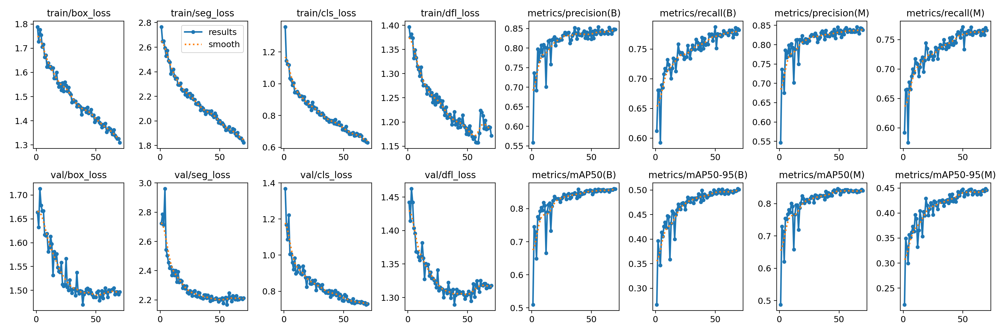

In [24]:
Image("yolov8_l_dataset/results/70_epochs-/results.png")

## Inference

In [20]:
inference_model = YOLO('yolov8_l_dataset/results/70_epochs-/weights/best.pt')


image 1/1 /content/yolov8_l_dataset/val/images/human_brain_8.png: 640x640 7 Nucleis, 71.7ms
Speed: 11.2ms preprocess, 71.7ms inference, 14.3ms postprocess per image at shape (1, 3, 640, 640)


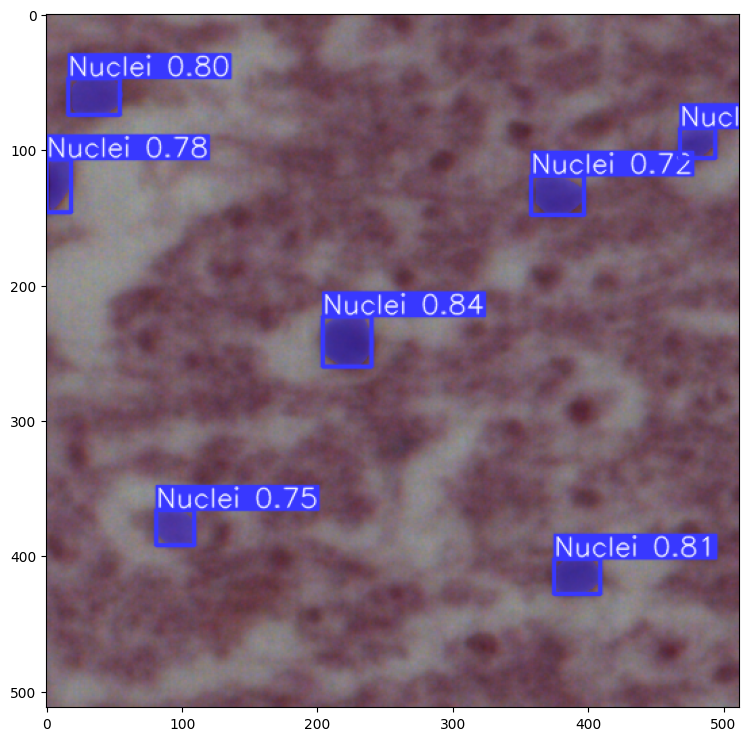

In [21]:
inference_img_path = "yolov8_l_dataset/val/images/human_bladder_03.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,visualize=False,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)



image 1/1 /content/yolov8_l_dataset/val/images/human_pancreas_42.png: 640x640 25 Nucleis, 70.7ms
Speed: 5.4ms preprocess, 70.7ms inference, 13.0ms postprocess per image at shape (1, 3, 640, 640)


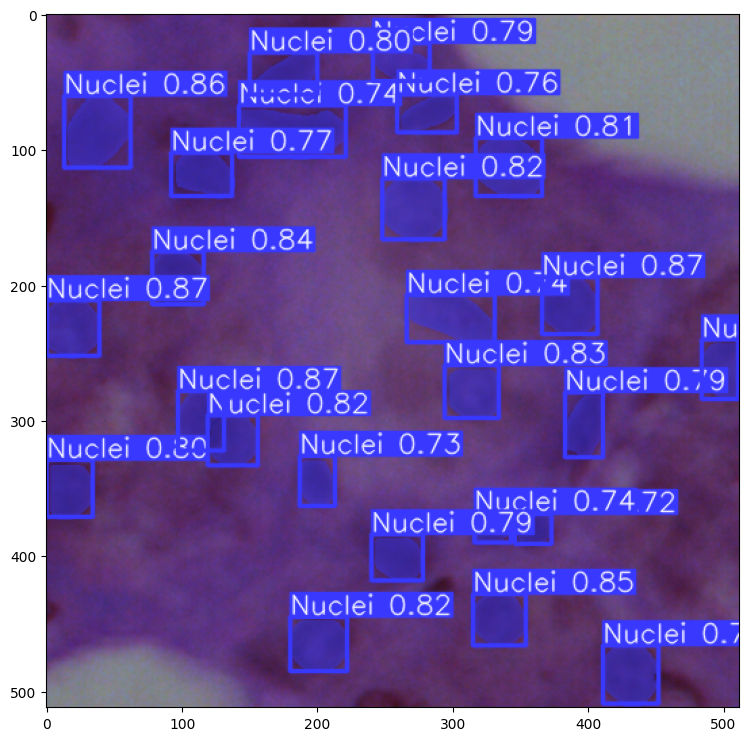

In [22]:
inference_img_path = "yolov8_l_dataset/val/images/human_cerebellum_6.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,visualize=False,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)


image 1/1 /content/yolov8_l_dataset/val/images/human_tongue_24.png: 640x640 9 Nucleis, 82.3ms
Speed: 4.0ms preprocess, 82.3ms inference, 8.2ms postprocess per image at shape (1, 3, 640, 640)


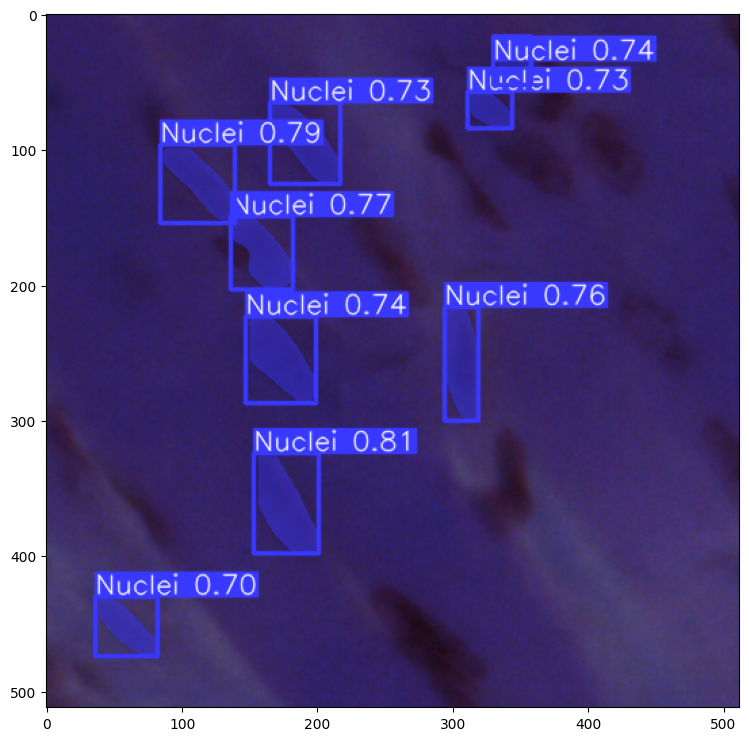

In [23]:
inference_img_path = "yolov8_l_dataset/val/images/human_epiglottis_4.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,visualize=False,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)


image 1/1 /content/yolov8_l_dataset/val/images/mouse_kidney_20.png: 640x640 20 Nucleis, 75.7ms
Speed: 3.5ms preprocess, 75.7ms inference, 11.2ms postprocess per image at shape (1, 3, 640, 640)


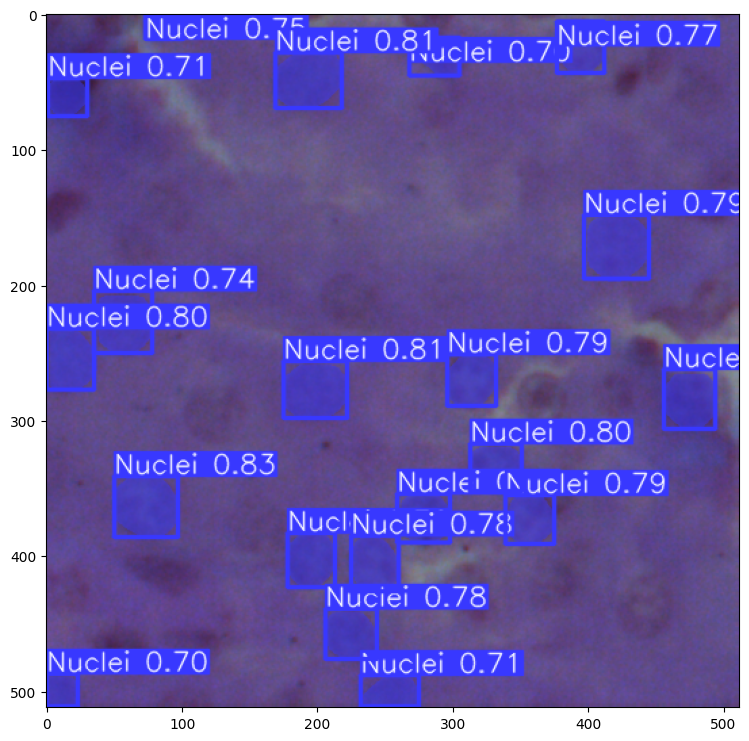

In [24]:
inference_img_path = "yolov8_l_dataset/val/images/human_jejunum_02.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,visualize=False,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)


image 1/1 /content/yolov8_l_dataset/val/images/human_placenta_29.png: 640x640 41 Nucleis, 71.4ms
Speed: 3.5ms preprocess, 71.4ms inference, 16.8ms postprocess per image at shape (1, 3, 640, 640)


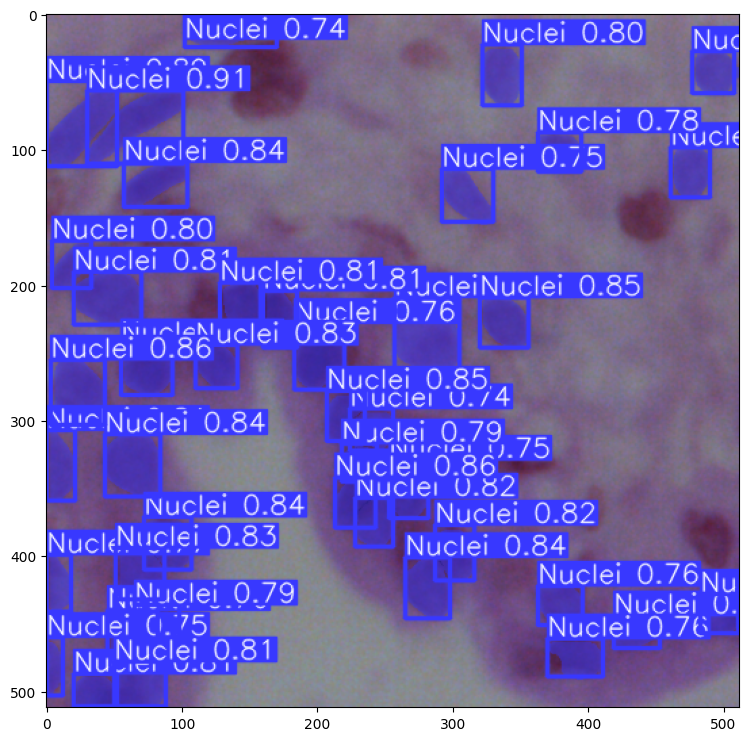

In [25]:
inference_img_path = "yolov8_l_dataset/val/images/human_kidney_01.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,visualize=False,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)


image 1/1 /content/yolov8_l_dataset/val/images/human_oesophagus_43.png: 640x640 30 Nucleis, 71.4ms
Speed: 3.4ms preprocess, 71.4ms inference, 13.5ms postprocess per image at shape (1, 3, 640, 640)


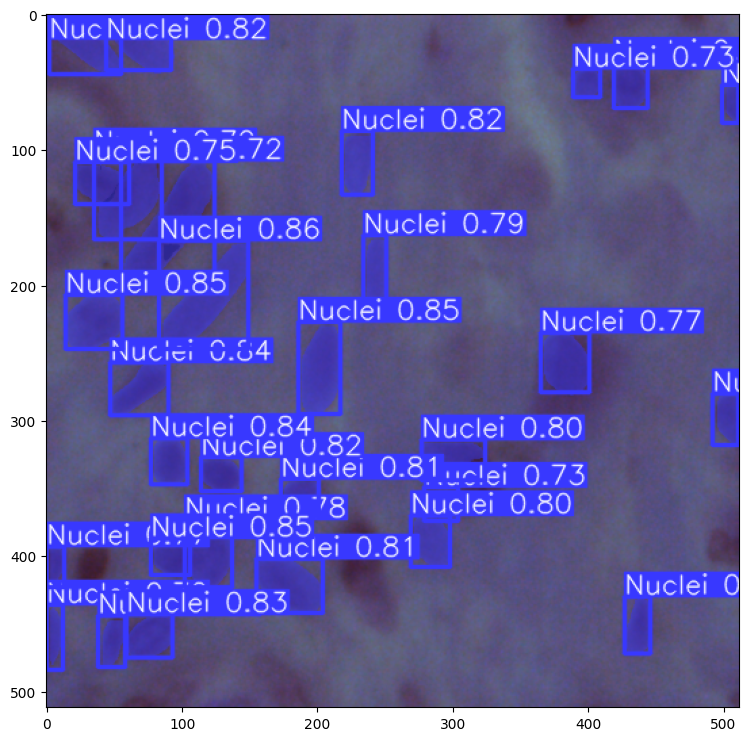

In [26]:
inference_img_path = "yolov8_l_dataset/val/images/human_liver_22.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,visualize=False,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)


image 1/1 /content/yolov8_l_dataset/val/images/human_cardia_5.png: 640x640 27 Nucleis, 67.6ms
Speed: 4.0ms preprocess, 67.6ms inference, 14.1ms postprocess per image at shape (1, 3, 640, 640)


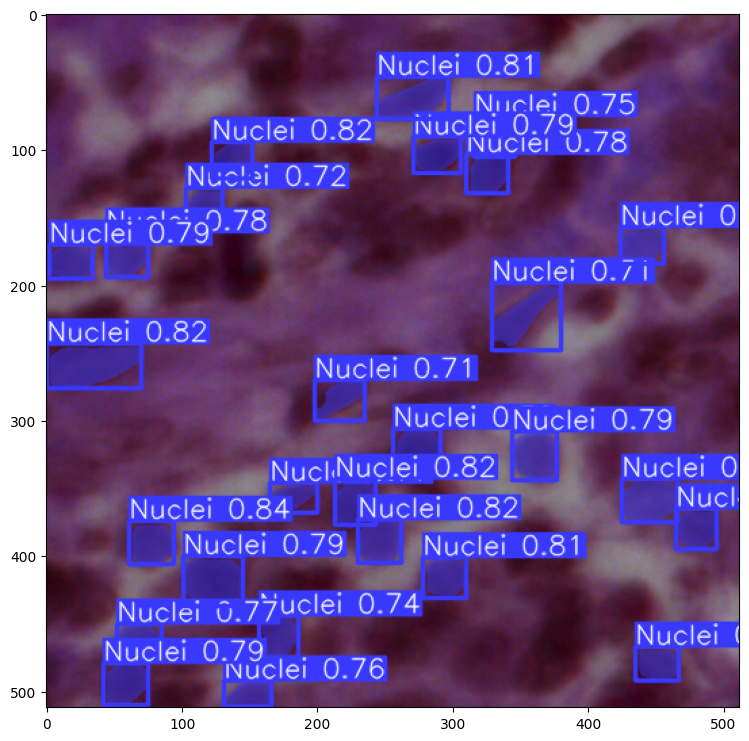

In [27]:
inference_img_path = "yolov8_l_dataset/val/images/human_melanoma_03.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,visualize=False,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)


image 1/1 /content/yolov8_l_dataset/val/images/human_jejunum_05.png: 640x640 22 Nucleis, 67.6ms
Speed: 3.5ms preprocess, 67.6ms inference, 11.0ms postprocess per image at shape (1, 3, 640, 640)


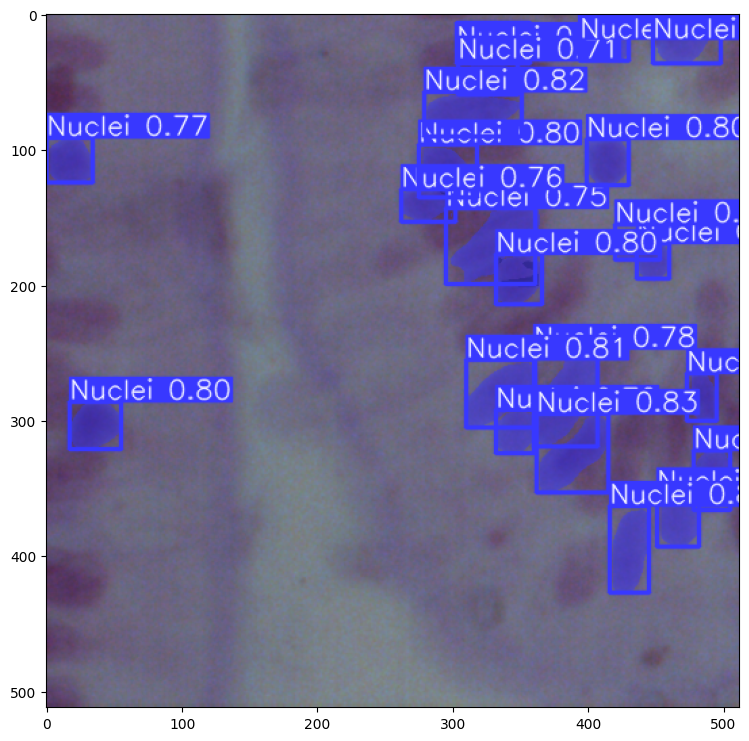

In [28]:
inference_img_path = "yolov8_l_dataset/val/images/human_pancreas_11.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,visualize=False,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)


image 1/1 /content/yolov8_l_dataset/val/images/human_liver_40.png: 640x640 18 Nucleis, 82.4ms
Speed: 9.0ms preprocess, 82.4ms inference, 10.6ms postprocess per image at shape (1, 3, 640, 640)


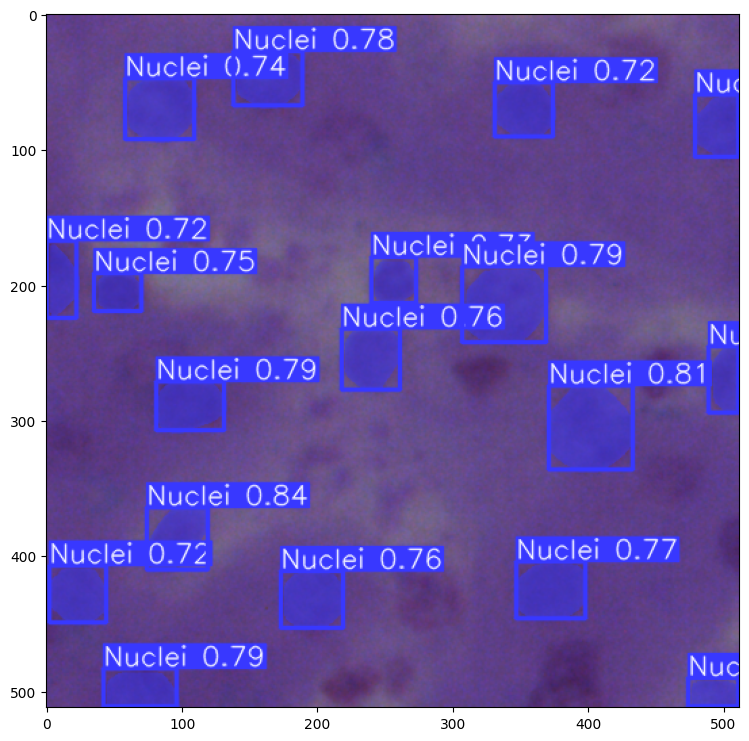

In [29]:
inference_img_path = "yolov8_l_dataset/val/images/human_peritoneum_3.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,visualize=False,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)

In [30]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [32]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [33]:
import shutil

# Define the paths
source_dir = '/content/yolov8_l_dataset'
destination_dir = '/content/drive/MyDrive/Yolov8l_exp'

# Copy the directory to Google Drive
shutil.copytree(source_dir, destination_dir)


'/content/drive/MyDrive/Yolov8l_exp'